This notebook implements the full working process to deal with different chains and compare the results.

In [1]:
import os, sys
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
import matplotlib.pyplot as plt
import yaml

# Define chain folder
chain_dir = os.path.join(os.getcwd(), 'chains/perlmutter/')

from getdist import loadMCSamples, plots, mcsamples, MCSamples
from python_scripts.prior import * 
from python_scripts.utils import *

2023-12-11 17:57:57.053618: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-11 17:57:57.256751: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-11 17:57:57.256843: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-11 17:57:57.257319: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-11 17:57:57.358456: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-11 17:57:57.362093: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

### 1. EFT BOSS: $p_k$ with $4$ sky-cuts, WC prior, BBN prior

#### Prior Sampling using the `full_prior` function
Details on the arguments of the `full_prior` function:  
- `root_dir`: full path to the directory containing the `log.param` file and the chains,
- `chain_name`: prefix used to name the chain files,
- `config_name`: simply the name of the `.yaml` file. 

In order to get the nuisance parameter's prior, remember to copy the `.yaml` configuration file given by PyBird inside the chain folder! Here you have to set the argument:
- `config_name`: the name (excluding the extension) of the configuration file, e.g. */boss_pk_wc*.

In [2]:
posterior = loadMCSamples(file_root=chain_dir+'/eftboss_wc_std/2023-12-04_10000_', settings={'ignore_rows':0.3})
posterior.name_tag = 'BOSS WC + BBN'

param_limits, prior = full_prior(root_dir=chain_dir+'eftboss_wc_std/', chain_name='2023-12-04_10000_', 
                                                config_name='eftboss_wc_std', name_tag='BOSS WC + BBN Prior')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
List of "derived"      parameters: ['Omega_m', 'A_s', 'sigma8']
List of "nuisance"     parameters: ['b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']

Fixed Parameter Limits:
omega_cdm    | (0.08, 0.16)  
h            | (0.635, 0.715)
ln10^{10}A_s | (2.644, 3.444)
n_s          | (0.765, 1.165)
b1_hN        | (0.0, 4.0)    
c2_hN        | (-10.0, 10.0) 
b1_hS        | (0.0, 4.0)    
c2_hS        | (-10.0, 10.0) 
b1_lN        | (0.0, 4.0)    
c2_lN        | (-10.0, 10.0) 
b1_lS        | (0.0, 4.0)    
c2_lS        | (-10.0, 10.0) 



In [3]:
cosmo_names = prior.getParamNames().list()[:8]
nuisance_names = prior.getParamNames().list()[8:]
# Plotting cosmological parameters
g = plots.get_subplot_plotter(width_inch=9)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
g.triangle_plot([posterior, prior], cosmo_names, title_limit=1,
                filled=True,
                param_limits=param_limits);

In [4]:
# Plotting nuisance parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
g.triangle_plot([posterior, prior], nuisance_names, title_limit=1,
                filled=True,
                param_limits=param_limits);

Non-log N_eff 	= 12.501



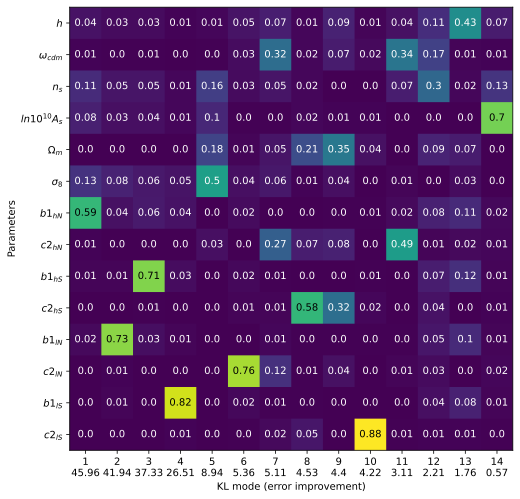

In [5]:
# Re-definition of params
params = ['h', 'omega_cdm', 'n_s', 'ln10^{10}A_s', 'Omega_m', 'sigma8', 
                'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']
labels = ['h', '\omega_{cdm}', 'n_s', '\ln{10^{10}A_s}', '\Omega_m', '\sigma_8',
                'b1_{hN}', 'c2_{hN}', 'b1_{hS}', 'c2_{hS}', 'b1_{lN}', 'c2_{lN}', 'b1_{lS}', 'c2_{lS}']

KL_eig, KL_eigv, KL_param_names = plot_frac_fisher(prior_chain=prior, posterior_chain=posterior, 
                                                   params=params, labels=labels, norm=True)

**Prior Shrinking**

In [6]:
idx = [posterior.index[name] for name in KL_param_names]
prior_mean = prior.getMeans(pars=[prior.index[name] for name in KL_param_names])
posterior_mean = posterior.getMeans(pars=[posterior.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Only keeping the first 11 modes
inv_KL_eigv[11:,:] = 0.
# Project the shifted posterior samples on the KL modes
KL_filtered_samples = np.dot(np.dot(posterior.samples[:,idx]-prior_mean, KL_eigv), inv_KL_eigv)+prior_mean

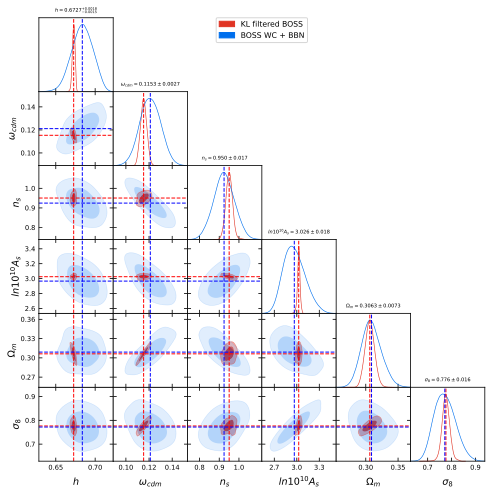

In [7]:
# Prior Shrinking - Cosmological Parameters
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior.loglikes, 
                     weights=posterior.weights, 
                     names=params, 
                     labels=[name.label for name in posterior.getParamNames().parsWithNames(params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
# Cosmological Parameters
temp_params = params[:6]
g.triangle_plot([KL_chain, posterior], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior.getMeans(pars=[posterior.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

In [8]:
# Prior Shrinking - EFT Parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
temp_params = params[6:]
g.triangle_plot([KL_chain, posterior], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior.getMeans(pars=[posterior.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

Looking at the Fractional Fisher Matrix above, now we realize that the $c2$ parameters are actually dominating on some modes and therefore the posterior is well-preserved after the prior shrinking. The only exception can be noticed on the 1D posterior distribution of $c2_{hN}$: from the matrix we can not conclude that it is being strongly informed by any of the 12 main modes. However, the last plot suggests that the posterior is almost not informed at all by the prior distribution: this effect could be a consequence of the clear non-gaussianities of this parameter's posterior.

### 2. EFT BOSS: $p_k$ with $4$ sky-cuts, WC prior, NO BBN prior
We now repeat the same procedure using the chains computed without the BBN prior on $\omega_b$.

In [9]:
nobbn_posterior = loadMCSamples(file_root=chain_dir+'/eftboss_wc_nobbn/2023-12-05_10000_', settings={'ignore_rows':0.3})
nobbn_posterior.name_tag = 'BOSS WC'

In [10]:
nobbn_param_limits, nobbn_prior = full_prior(root_dir=chain_dir+'eftboss_wc_nobbn/', chain_name='2023-12-05_10000_', 
                                                config_name='eftboss_wc_std', name_tag='BOSS WC Prior')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
List of "derived"      parameters: ['Omega_m', 'A_s', 'sigma8']
List of "nuisance"     parameters: ['b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']

Fixed Parameter Limits:
omega_b      | (2.068, 2.468)
omega_cdm    | (0.08, 0.16)  
h            | (0.635, 0.715)
ln10^{10}A_s | (2.644, 3.444)
n_s          | (0.765, 1.165)
b1_hN        | (0.0, 4.0)    
c2_hN        | (-10.0, 10.0) 
b1_hS        | (0.0, 4.0)    
c2_hS        | (-10.0, 10.0) 
b1_lN        | (0.0, 4.0)    
c2_lN        | (-10.0, 10.0) 
b1_lS        | (0.0, 4.0)    
c2_lS        | (-10.0, 10.0) 



In [11]:
# Plotting cosmological parameters
g = plots.get_subplot_plotter(width_inch=9)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
g.triangle_plot([nobbn_posterior, nobbn_prior], cosmo_names, title_limit=1,
                filled=True,
                param_limits=nobbn_param_limits);